In [1]:
import json
import itertools
import glob
import os
import io
from collections import defaultdict
import zlib
import pickle

import torch
import numpy as np
import matplotlib.pyplot as plt
from transformers import Mask2FormerForUniversalSegmentation
from PIL import Image


from my_utils import greedy_iou, load_segmentation_and_info, show_segmentation, sam_demo


id2label = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-base-coco-panoptic").config.id2label

In [2]:
# load SAM model and mask generator
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "pretrained_checkpoint/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

## SAM vs Ensemble

0 0


/home/yjl/segment-anything/my_utils.py:182: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646756402876/work/torch/csrc/utils/tensor_numpy.cpp:178.)
  segmentation = torch.from_numpy(segmentation)


img_name: 000000129113

img_name: 000000253002

img_name: 000000433980

img_name: 000000270386

img_name: 000000104119

img_name: 000000527960

img_name: 000000296634



img_name: 000000221213

img_name: 000000146498

img_name: 000000138550



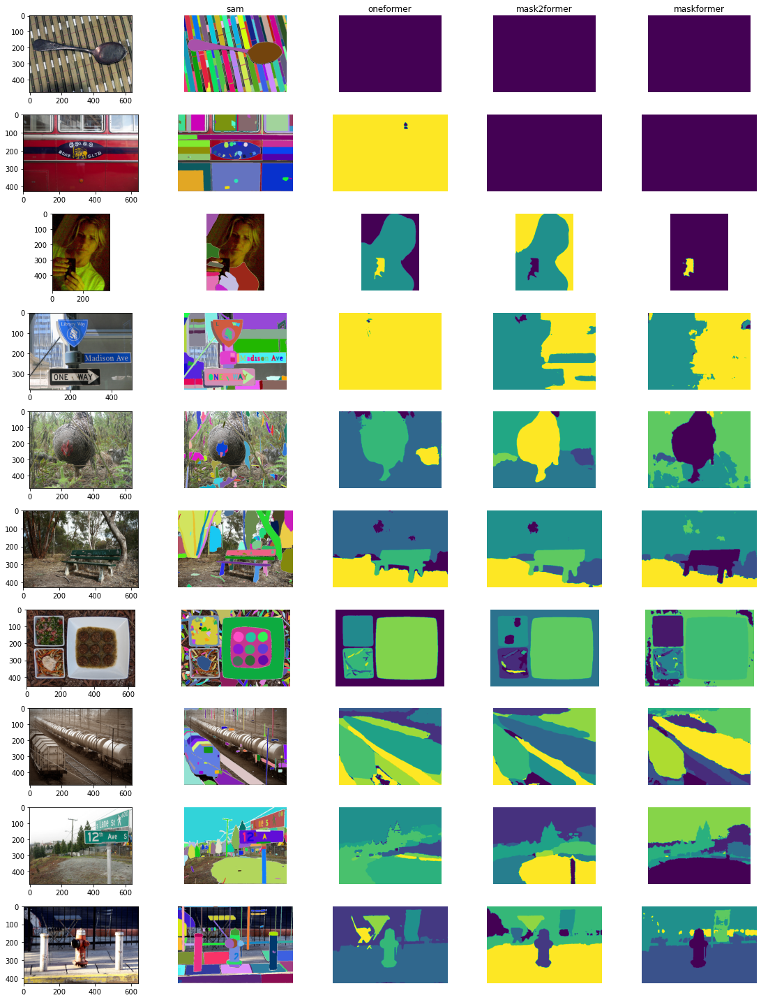

In [3]:
""" Find the most dissimilar images between SAM and attacker ensemble. """
segment_area_thresh_low = 0.01
segment_area_thresh_high = 0.81
saved_json_ls = sorted(glob.glob('/home/yjl/data/val2017_similarity/*'))
metrics = [
		'greedyiou_crossReference'
 		# 'greedyiou', 'greedyiou_nms', 'greedyiou_nms_crossReference', 'greedyiou_nms_crossReference_areaWeighted',\
		# f'greedyiou_thresh{segment_area_thresh_low}-{segment_area_thresh_high}', 
		# f'greedyiou_thresh{segment_area_thresh_low}-{segment_area_thresh_high}_nms', 
		# f'greedyiou_thresh{segment_area_thresh_low}-{segment_area_thresh_high}_nms_crossReference', 
		# f'greedyiou_thresh{segment_area_thresh_low}-{segment_area_thresh_high}_nms_crossReference_areaWeighted',
		# f'greedyiou_thresh{segment_area_thresh_low}-{segment_area_thresh_high}_nms_crossReference_areaWeighted_1discrepancy',
		# f'greedyiou_thresh{segment_area_thresh_low}-{segment_area_thresh_high}_nms_crossReference_areaWeighted_2discrepancy',
		# f'greedyiou_thresh{segment_area_thresh_low}-{segment_area_thresh_high}_nms_crossReference_areaWeighted_3discrepancy',
	]
models = ['sam', 'oneformer', 'mask2former', 'maskformer']
attackers = models[1:]
combinations = list(itertools.combinations(attackers, 2))
metric_dict = {metric: [] for metric in metrics}

num_err = 0
inside_err_num = 0
for saved_json in saved_json_ls:
	with open(saved_json, 'r') as file:
		data = json.load(file)
	# print(data['sam_attackersEnsemble'])
	try:
		for metric in metrics:
			if metric.endswith('discrepancy'):
				total_score = data['sam_attackersEnsemble'][metric[:-13]] # 13 is the length of _1discrepancy
				
				for model1, model2 in combinations:
					try:
						if data[model1+'_'+model2]['greedyiou_area_weighted'] == -1:
							total_score += 100
						else:
							total_score += data[model1+'_'+model2]['greedyiou_area_weighted'] * int(metric[-12]) # -12 is the idx of weight parameter
					except KeyError:
						total_score += 100
						inside_err_num += 1
				metric_dict[metric].append(total_score)
			else:
				metric_dict[metric].append(data['sam_attackersEnsemble'][metric])

	except:
		num_err += 1
		metric_dict[metric].append(1)
print('num_err, inside_err_num:', num_err, inside_err_num)
# find the minimum 10 value and their image name
min_metric_idx_dict = {metric: np.array(metric_dict[metric]).argsort()[:10] for metric in metrics}

for metric in metrics:
	fig, axs = plt.subplots(len(min_metric_idx_dict[metric]), len(models)+1, figsize=(16, 20))
	for i, idx in enumerate(min_metric_idx_dict[metric]):
		img_name = os.path.basename(saved_json_ls[idx]).split('.')[0]
		img = Image.open(f'/home/yjl/data/val2017/{img_name}.jpg')
		axs[i, 0].imshow(img)
		info_text = ''
		info_text += 'img_name: '+img_name+'\n'
		# show segmentation results of top performers
		for j, m in enumerate(models, 1):
			show_segmentation(ax=axs[i, j], img_name=img_name, model_name=m, mask_generator=mask_generator, transparency=0, id2label=id2label, legend=False)
		# set row header using ylabel
		# axs[i, 0].set_ylabel(info_text, rotation=0, loc='bottom')
		# print(info_text)
	for j, m in enumerate(models, 1):
		axs[0, j].set_title(m)
	plt.tight_layout()
	plt.savefig(metric+'_ensemble.jpg')

## Show Found Failures

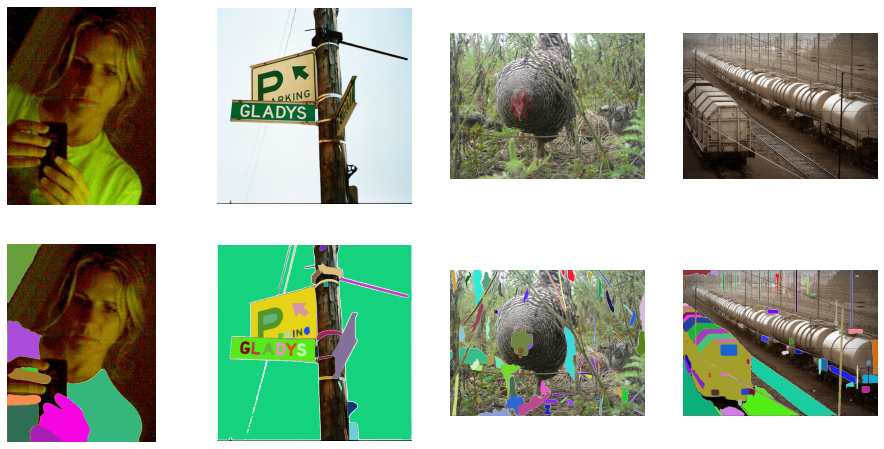

In [22]:
found_failures = ['000000433980', '000000058636', '000000104119', '000000221213']
fig, axs = plt.subplots(2, len(found_failures), figsize=(16, 8))
for i, img_name in enumerate(found_failures):
	img = Image.open(f'/home/yjl/data/val2017/{img_name}.jpg')
	axs[0, i].imshow(img)
	# axis off
	axs[0, i].axis('off')
	show_segmentation(ax=axs[1, i], img_name=img_name, model_name='sam', mask_generator=mask_generator, transparency=0, id2label=id2label, legend=False)
	# set row header using ylabel
	# axs[i, 0].set_ylabel(info_text, rotation=0, loc='bottom')
	# print(info_text)
# for j, m in enumerate(models, 1):
# 	axs[0, j].set_title(m)
plt.savefig('found_failures.jpg')

## Vanila Greedy IOU

[0.00795677 0.00824569 0.00913864 0.00943372 0.01069872]
['000000374727', '000000461036', '000000311950', '000000176847', '000000357501']


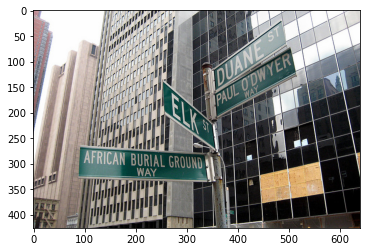

sam oneformer greedyiou: 0.007956767454743385
sam mask2former greedyiou: 0.007364216260612011
sam maskformer greedyiou: 0.007897383533418179
------------------------------ SAM ------------------------------


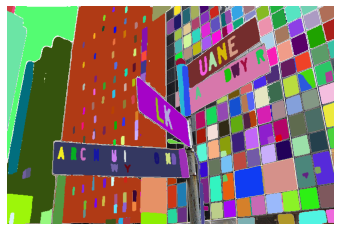

------------------------------ oneformer ------------------------------


/home/yjl/segment-anything/my_utils.py:137: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646756402876/work/torch/csrc/utils/tensor_numpy.cpp:178.)
  segmentation = torch.from_numpy(segmentation)


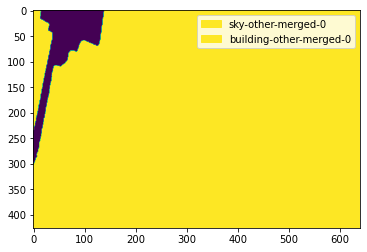

------------------------------ mask2former ------------------------------


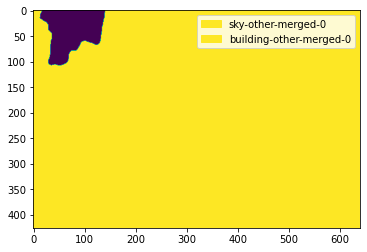

------------------------------ maskformer ------------------------------


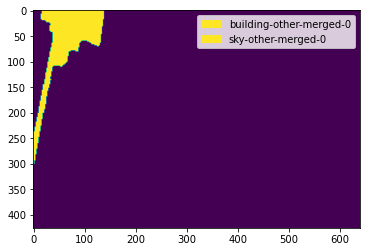

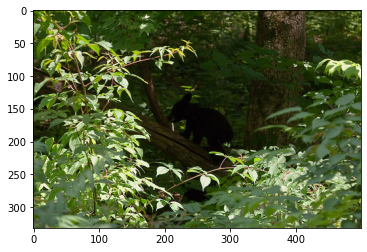

sam oneformer greedyiou: 0.008039339445531368
sam mask2former greedyiou: 0.008124807849526405
sam maskformer greedyiou: 0.00824569072574377
------------------------------ SAM ------------------------------


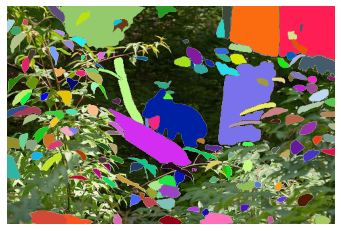

------------------------------ oneformer ------------------------------


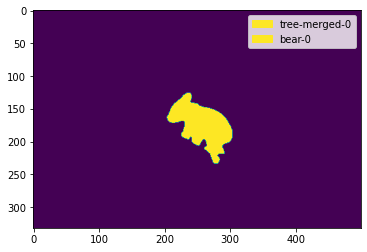

------------------------------ mask2former ------------------------------


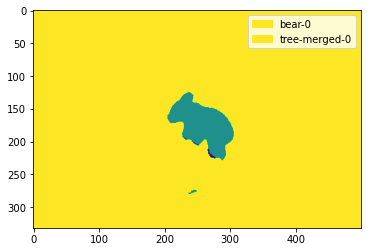

------------------------------ maskformer ------------------------------


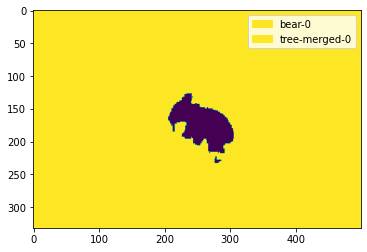

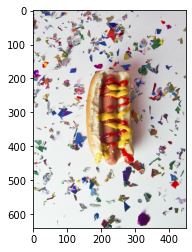

sam oneformer greedyiou: 0.009138643741607666
sam mask2former greedyiou: 0.009008567780256271
sam maskformer greedyiou: 0.00908630434423685
------------------------------ SAM ------------------------------


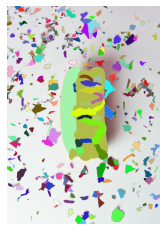

------------------------------ oneformer ------------------------------


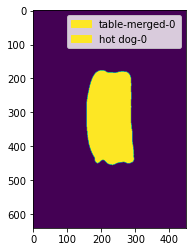

------------------------------ mask2former ------------------------------


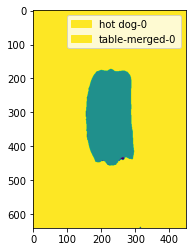

------------------------------ maskformer ------------------------------


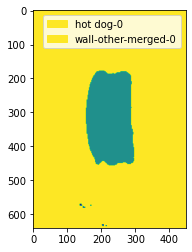

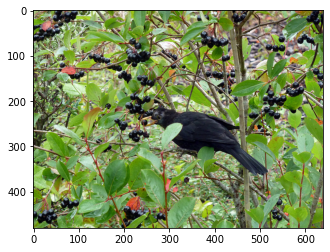

sam oneformer greedyiou: 0.009272683411836624
sam mask2former greedyiou: 0.009433720260858536
sam maskformer greedyiou: 0.009131437167525291
------------------------------ SAM ------------------------------


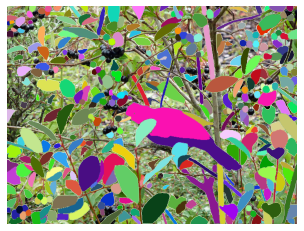

------------------------------ oneformer ------------------------------


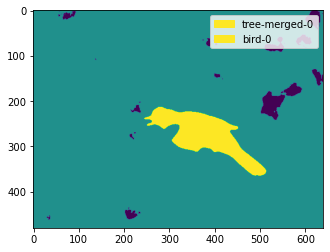

------------------------------ mask2former ------------------------------


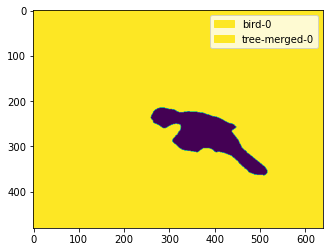

------------------------------ maskformer ------------------------------


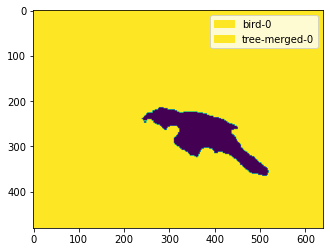

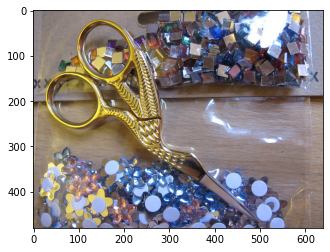

sam oneformer greedyiou: 0.010698718018829823
sam mask2former greedyiou: 0.007158362772315741
sam maskformer greedyiou: 0.008317787200212479
------------------------------ SAM ------------------------------


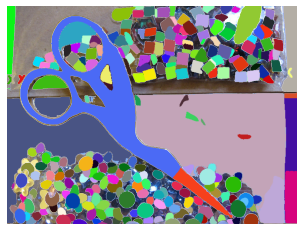

------------------------------ oneformer ------------------------------


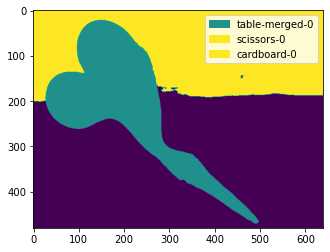

------------------------------ mask2former ------------------------------


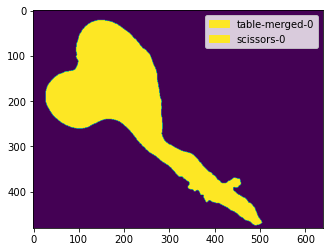

------------------------------ maskformer ------------------------------


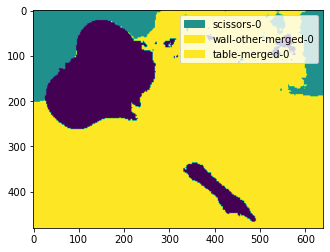

In [5]:
""" Find the images that sam predicts differently from the all top performers.
"""
saved_json_ls = sorted(glob.glob('/home/yjl/data/val2017_similarity/*'))
top_performers = ['oneformer', 'mask2former', 'maskformer']
combinations = [('sam', top_performer) for top_performer in top_performers]

# find max distance between sam and top performers for each image
max_distance_ls = []
for saved_json in saved_json_ls:
	with open(saved_json, 'r') as file:
		data = json.load(file)
	max_distance = 0
	for model1, model2 in combinations:
		max_distance = max(max_distance, data[model1+'_'+model2]['greedyiou'])
	max_distance_ls.append(max_distance)
max_distance_ls = np.array(max_distance_ls)

# find the minimum 5 value and their image name
idx_ls = max_distance_ls.argsort()[:5]
print(max_distance_ls[idx_ls])
print([os.path.basename(saved_json_ls[i]).split('.')[0] for i in idx_ls])

# show the images
for i in idx_ls:
	img_name = os.path.basename(saved_json_ls[i]).split('.')[0]
	img_path = f'/home/yjl/data/val2017/{img_name}.jpg'
	img = Image.open(img_path)
	plt.imshow(img)
	plt.show()
	# print ious of combinations
	with open(saved_json_ls[i], 'r') as file:
		data = json.load(file)
	for model1, model2 in combinations:
		print(model1, model2, "greedyiou:", data[model1+'_'+model2]['greedyiou'])
	# show segmentation results of top performers
	print('-'*30, 'SAM', '-'*30)
	sam_demo(img_path, mask_generator, transparency=0)
	for m in top_performers:
		print('-'*30, m, '-'*30)
		show_segmentation(img_name=img_name, model_name=m, id2label=id2label)

## Top 10 Greedy IoU

[0.04242578 0.08634839 0.09833129 0.10455713 0.10725455]
['000000129113', '000000433980', '000000058636', '000000132622', '000000560371']


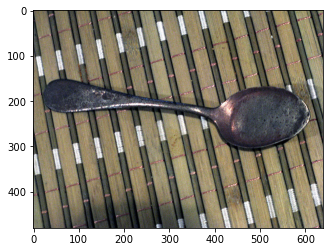

sam oneformer greedyiou_top10: 0.04242577776312828
sam mask2former greedyiou_top10: 0.04242577776312828
sam maskformer greedyiou_top10: 0.04242577776312828
------------------------------ SAM ------------------------------


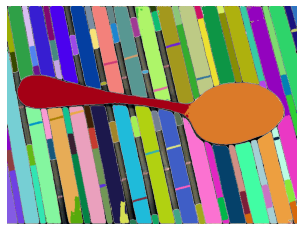

------------------------------ oneformer ------------------------------


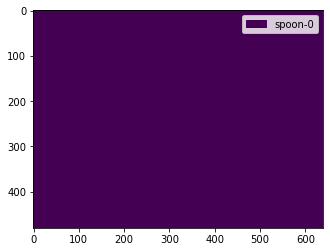

------------------------------ mask2former ------------------------------


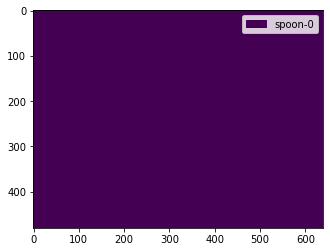

------------------------------ maskformer ------------------------------


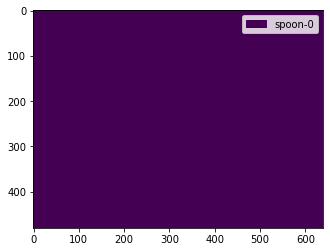

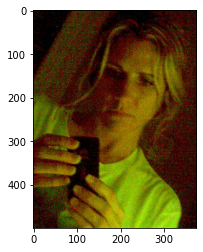

sam oneformer greedyiou_top10: 0.08477340638637543
sam mask2former greedyiou_top10: 0.08634839206933975
sam maskformer greedyiou_top10: 0.05429645627737045
------------------------------ SAM ------------------------------


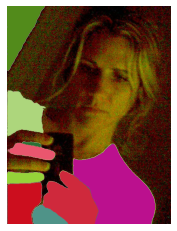

------------------------------ oneformer ------------------------------


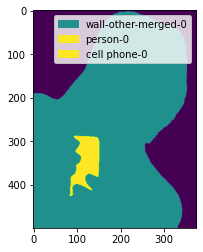

------------------------------ mask2former ------------------------------


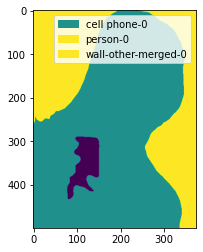

------------------------------ maskformer ------------------------------


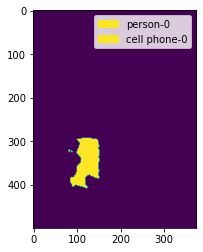

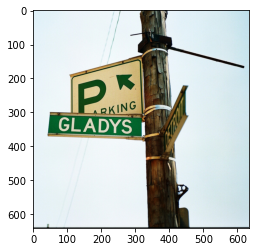

sam oneformer greedyiou_top10: 0.09833128750324249
sam mask2former greedyiou_top10: 0.09833128750324249
sam maskformer greedyiou_top10: 0.09833128750324249
------------------------------ SAM ------------------------------


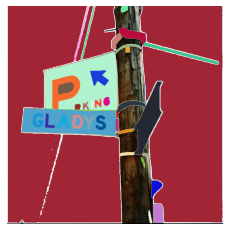

------------------------------ oneformer ------------------------------


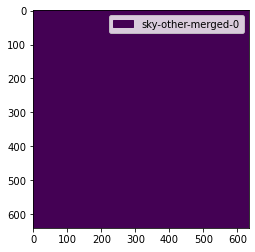

------------------------------ mask2former ------------------------------


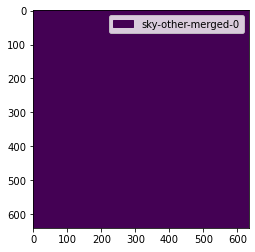

------------------------------ maskformer ------------------------------


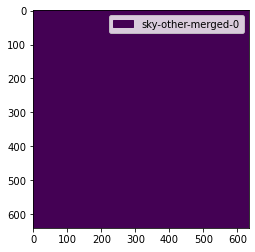

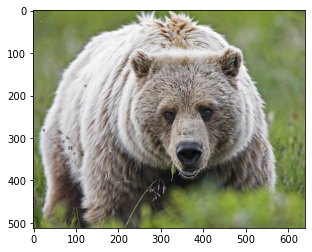

sam oneformer greedyiou_top10: 0.10099785029888153
sam mask2former greedyiou_top10: 0.10207728296518326
sam maskformer greedyiou_top10: 0.10455713421106339
------------------------------ SAM ------------------------------


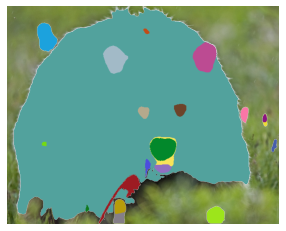

------------------------------ oneformer ------------------------------


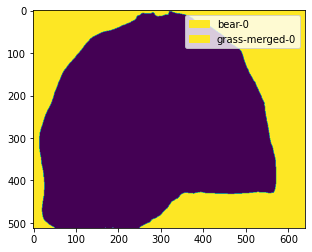

------------------------------ mask2former ------------------------------


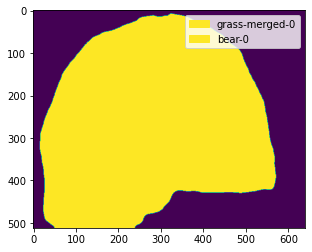

------------------------------ maskformer ------------------------------


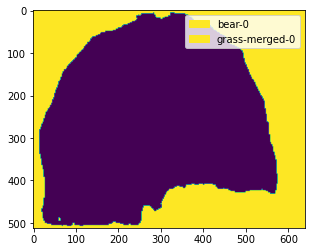

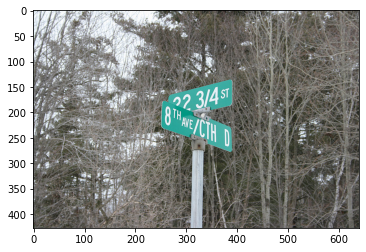

sam oneformer greedyiou_top10: 0.10725454986095428
sam mask2former greedyiou_top10: 0.1070154458284378
sam maskformer greedyiou_top10: 0.1071833148598671
------------------------------ SAM ------------------------------


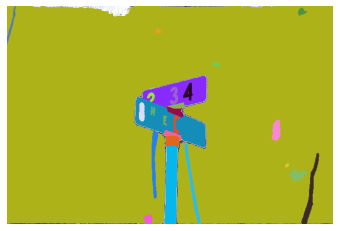

------------------------------ oneformer ------------------------------


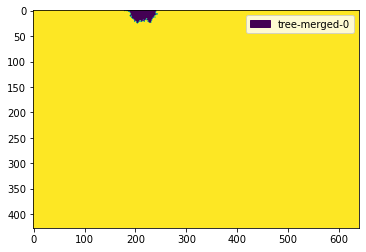

------------------------------ mask2former ------------------------------


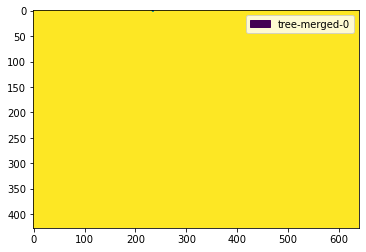

------------------------------ maskformer ------------------------------


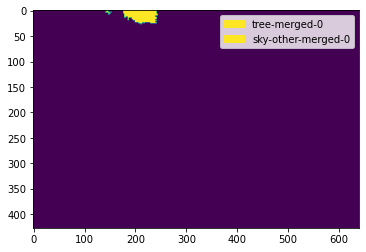

In [ ]:
""" Find the images that sam predicts differently from the all top performers.
"""
saved_json_ls = sorted(glob.glob('/home/yjl/data/val2017_similarity/*'))
top_performers = ['oneformer', 'mask2former', 'maskformer']
combinations = [('sam', top_performer) for top_performer in top_performers]

# find max distance between sam and top performers for each image
max_distance_ls = []
for saved_json in saved_json_ls:
	with open(saved_json, 'r') as file:
		data = json.load(file)
	max_distance = 0
	for model1, model2 in combinations:
		max_distance = max(max_distance, data[model1+'_'+model2]['greedyiou_top10'])
	max_distance_ls.append(max_distance)
max_distance_ls = np.array(max_distance_ls)

# find the minimum 5 value and their image name
idx_ls = max_distance_ls.argsort()[:5]
print(max_distance_ls[idx_ls])
print([os.path.basename(saved_json_ls[i]).split('.')[0] for i in idx_ls])

# show the images
for i in idx_ls:
	img_name = os.path.basename(saved_json_ls[i]).split('.')[0]
	img_path = f'/home/yjl/data/val2017/{img_name}.jpg'
	img = Image.open(img_path)
	plt.imshow(img)
	plt.show()
	# print ious of combinations
	with open(saved_json_ls[i], 'r') as file:
		data = json.load(file)
	for model1, model2 in combinations:
		print(model1, model2, "greedyiou_top10:", data[model1+'_'+model2]['greedyiou_top10'])
	# show segmentation results of top performers
	print('-'*30, 'SAM', '-'*30)
	sam_demo(img_path, mask_generator, transparency=0)

	for m in top_performers:
		print('-'*30, m, '-'*30)
		show_segmentation(img_name=img_name, model_name=m, id2label=id2label)

# 

## Area Wighted Greedy IoU

[0.02852412 0.03416483 0.04819253 0.04856952 0.05999669 0.06632978
 0.06809137 0.07006996 0.07026702 0.07139616 0.07277126 0.0767189
 0.08461036 0.08487467 0.08584549 0.08739286 0.09048066 0.09164988
 0.09403748 0.1052049 ]
['000000104119', '000000461036', '000000129113', '000000152771', '000000049091', '000000344795', '000000194746', '000000083540', '000000106881', '000000044260', '000000402519', '000000472030', '000000184978', '000000433980', '000000182441', '000000449406', '000000034205', '000000339870', '000000127476', '000000176847']
000000104119


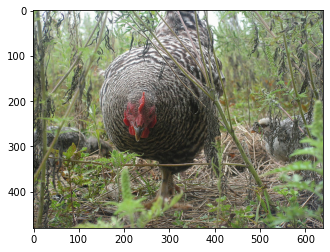

sam oneformer greedyiou_area_weighted: 0.0045380666851997375
sam mask2former greedyiou_area_weighted: 0.02172243595123291
sam maskformer greedyiou_area_weighted: 0.028524119406938553
------------------------------ SAM ------------------------------


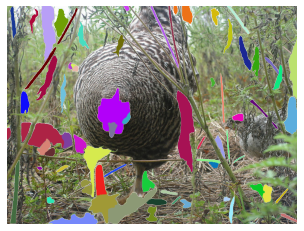

------------------------------ oneformer ------------------------------


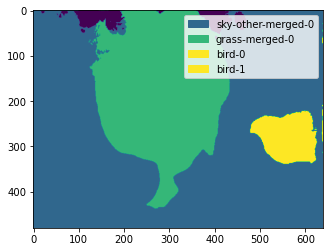

------------------------------ mask2former ------------------------------


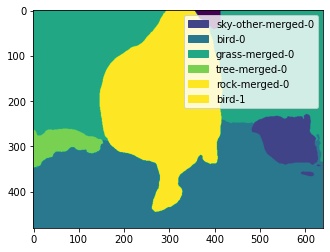

------------------------------ maskformer ------------------------------


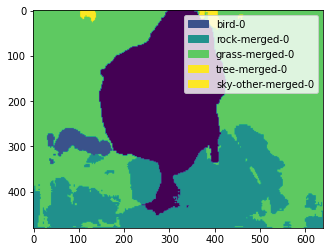

000000461036


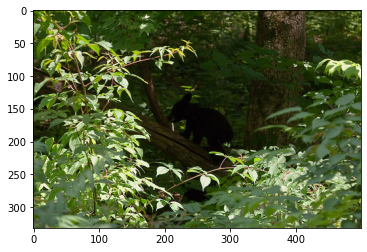

sam oneformer greedyiou_area_weighted: 0.03318589925765991
sam mask2former greedyiou_area_weighted: 0.032872460782527924
sam maskformer greedyiou_area_weighted: 0.03416483476758003
------------------------------ SAM ------------------------------


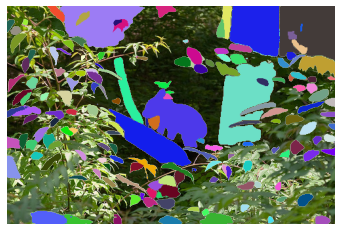

------------------------------ oneformer ------------------------------


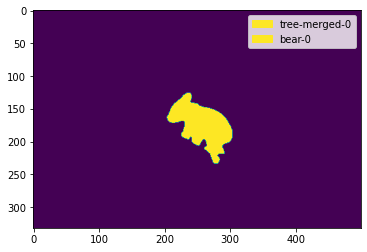

------------------------------ mask2former ------------------------------


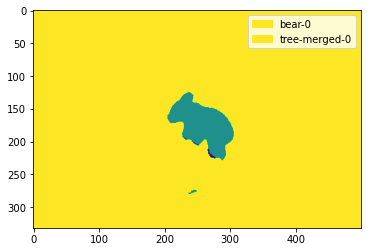

------------------------------ maskformer ------------------------------


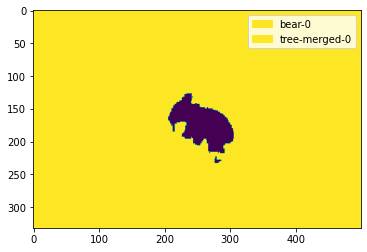

000000129113


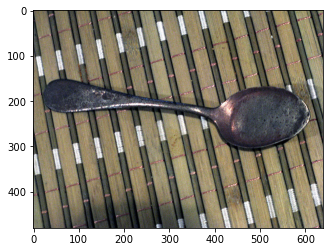

sam oneformer greedyiou_area_weighted: 0.04819253087043762
sam mask2former greedyiou_area_weighted: 0.04819253087043762
sam maskformer greedyiou_area_weighted: 0.04819253087043762
------------------------------ SAM ------------------------------


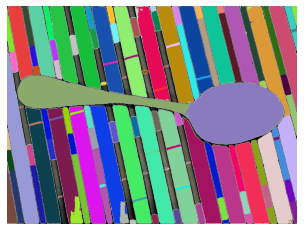

------------------------------ oneformer ------------------------------


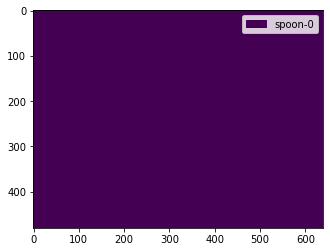

------------------------------ mask2former ------------------------------


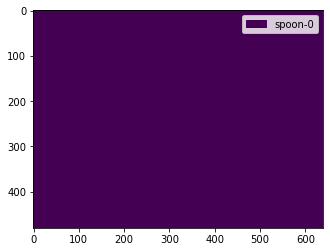

------------------------------ maskformer ------------------------------


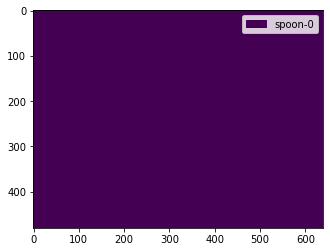

000000152771


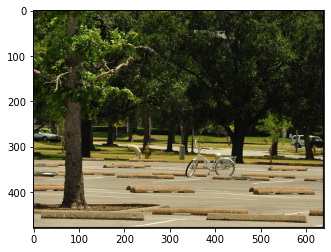

sam oneformer greedyiou_area_weighted: 0.03228795528411865
sam mask2former greedyiou_area_weighted: 0.03064831718802452
sam maskformer greedyiou_area_weighted: 0.048569515347480774
------------------------------ SAM ------------------------------


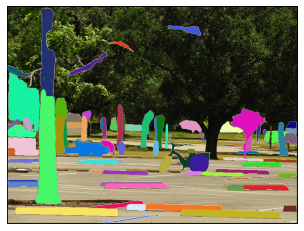

------------------------------ oneformer ------------------------------


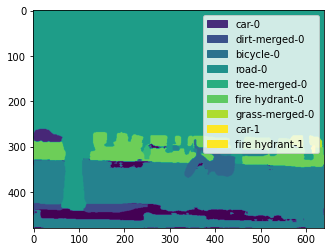

------------------------------ mask2former ------------------------------


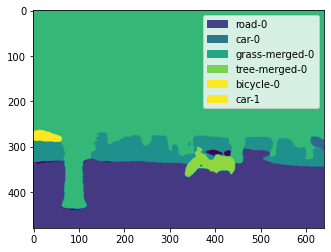

------------------------------ maskformer ------------------------------


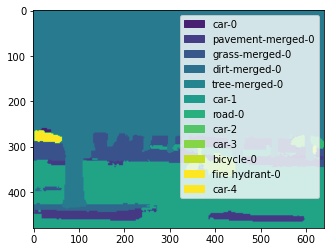

000000049091


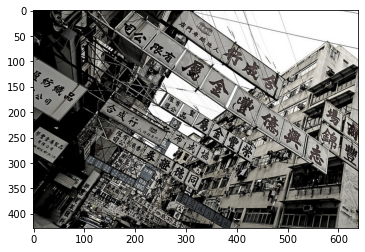

sam oneformer greedyiou_area_weighted: 0.05999668687582016
sam mask2former greedyiou_area_weighted: 0.022679582238197327
sam maskformer greedyiou_area_weighted: 0.031358156353235245
------------------------------ SAM ------------------------------


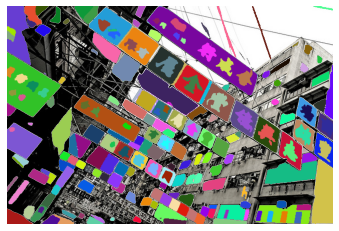

------------------------------ oneformer ------------------------------


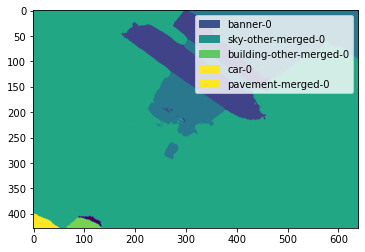

------------------------------ mask2former ------------------------------


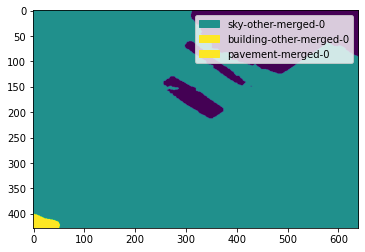

------------------------------ maskformer ------------------------------


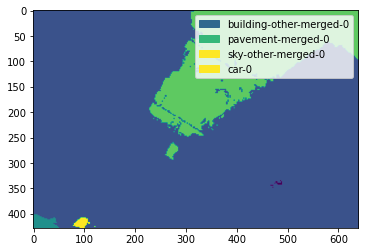

000000344795


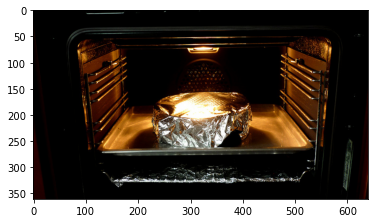

sam oneformer greedyiou_area_weighted: 0.06632978469133377
sam mask2former greedyiou_area_weighted: 0.0508166141808033
sam maskformer greedyiou_area_weighted: 0.0662078857421875
------------------------------ SAM ------------------------------


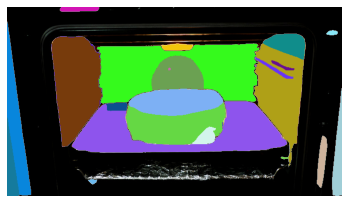

------------------------------ oneformer ------------------------------


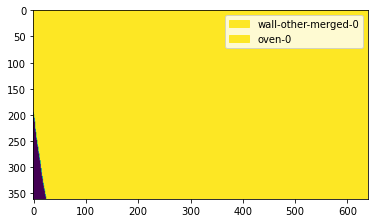

------------------------------ mask2former ------------------------------


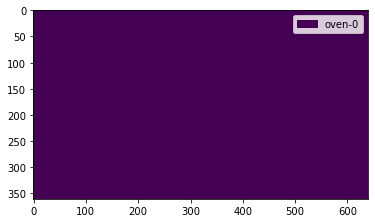

------------------------------ maskformer ------------------------------


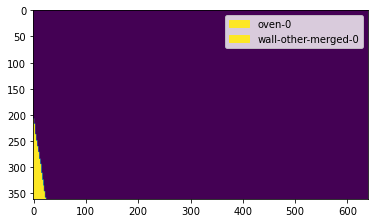

000000194746


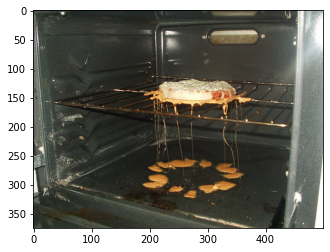

sam oneformer greedyiou_area_weighted: 0.06809137016534805
sam mask2former greedyiou_area_weighted: 0.0252849031239748
sam maskformer greedyiou_area_weighted: 0.06488511711359024
------------------------------ SAM ------------------------------


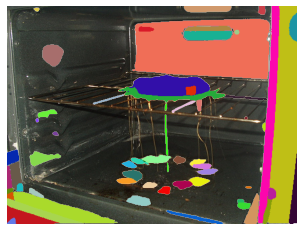

------------------------------ oneformer ------------------------------


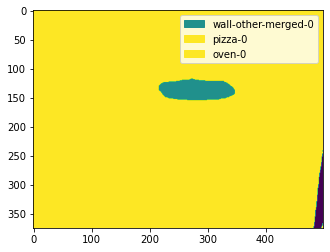

------------------------------ mask2former ------------------------------


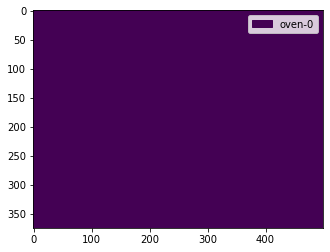

------------------------------ maskformer ------------------------------


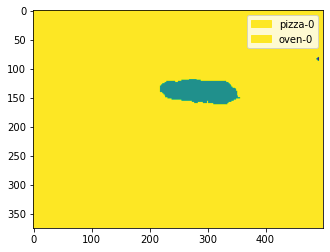

000000083540


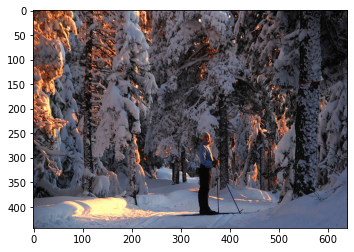

sam oneformer greedyiou_area_weighted: 0.07006996124982834
sam mask2former greedyiou_area_weighted: 0.06958875805139542
sam maskformer greedyiou_area_weighted: 0.06915207207202911
------------------------------ SAM ------------------------------


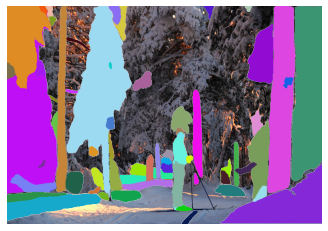

------------------------------ oneformer ------------------------------


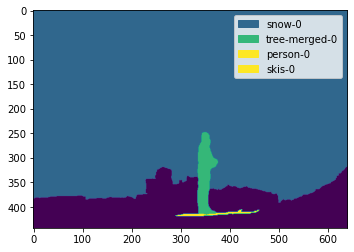

------------------------------ mask2former ------------------------------


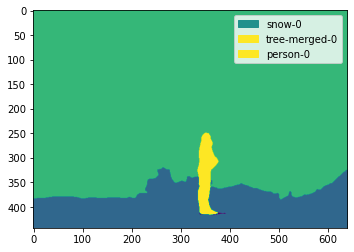

------------------------------ maskformer ------------------------------


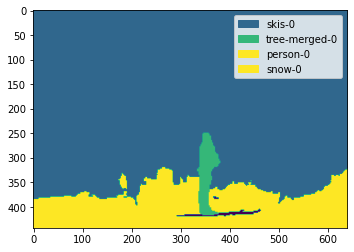

000000106881


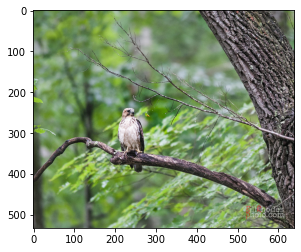

sam oneformer greedyiou_area_weighted: 0.07026702165603638
sam mask2former greedyiou_area_weighted: 0.06915640830993652
sam maskformer greedyiou_area_weighted: 0.0694480612874031
------------------------------ SAM ------------------------------


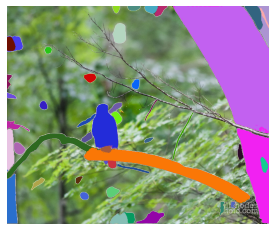

------------------------------ oneformer ------------------------------


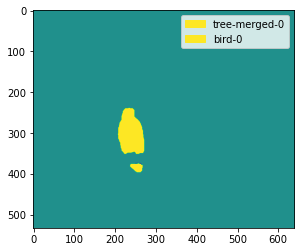

------------------------------ mask2former ------------------------------


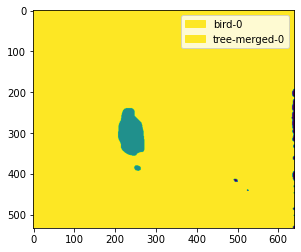

------------------------------ maskformer ------------------------------


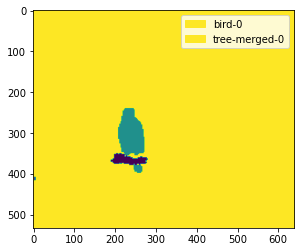

000000044260


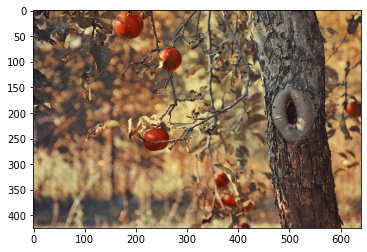

sam oneformer greedyiou_area_weighted: 0.024830881506204605
sam mask2former greedyiou_area_weighted: 0.06958801299333572
sam maskformer greedyiou_area_weighted: 0.07139615714550018
------------------------------ SAM ------------------------------


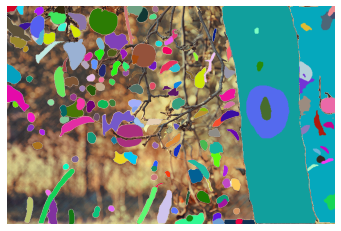

------------------------------ oneformer ------------------------------


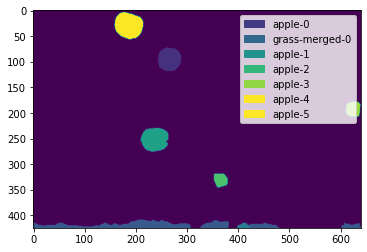

------------------------------ mask2former ------------------------------


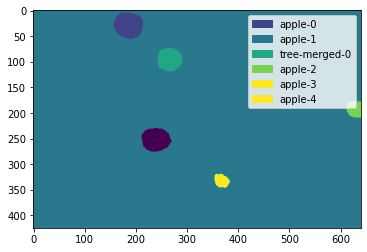

------------------------------ maskformer ------------------------------


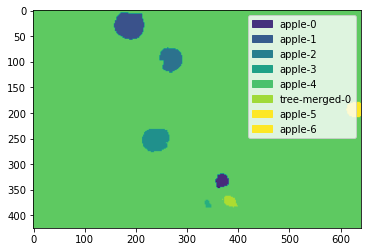

000000402519


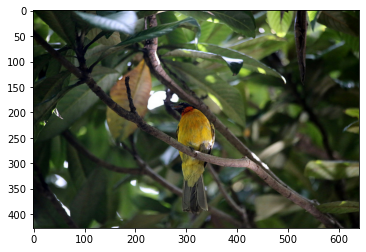

sam oneformer greedyiou_area_weighted: 0.07277125865221024
sam mask2former greedyiou_area_weighted: 0.06479784101247787
sam maskformer greedyiou_area_weighted: 0.06504927575588226
------------------------------ SAM ------------------------------


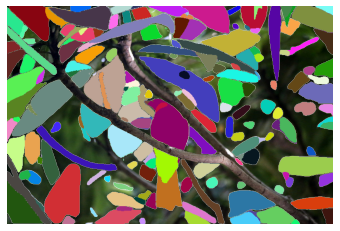

------------------------------ oneformer ------------------------------


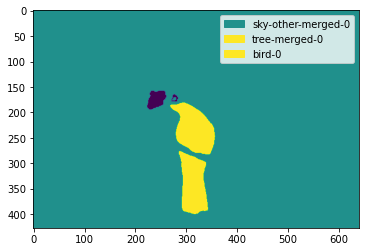

------------------------------ mask2former ------------------------------


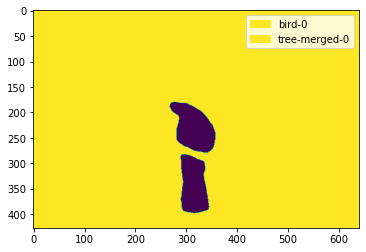

------------------------------ maskformer ------------------------------


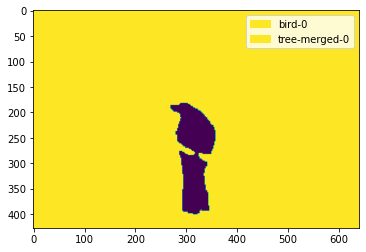

000000472030


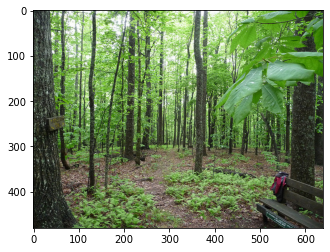

sam oneformer greedyiou_area_weighted: 0.05469357594847679
sam mask2former greedyiou_area_weighted: 0.06953906267881393
sam maskformer greedyiou_area_weighted: 0.07671890407800674
------------------------------ SAM ------------------------------


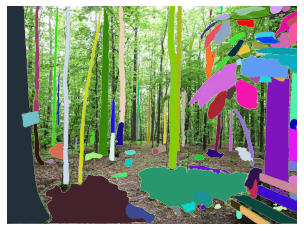

------------------------------ oneformer ------------------------------


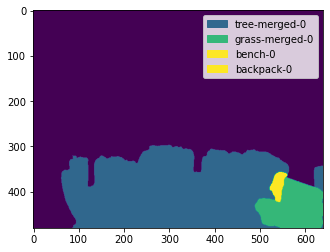

------------------------------ mask2former ------------------------------


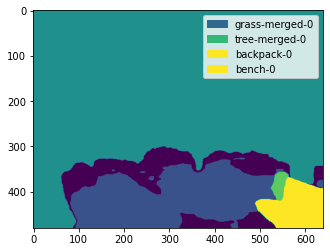

------------------------------ maskformer ------------------------------


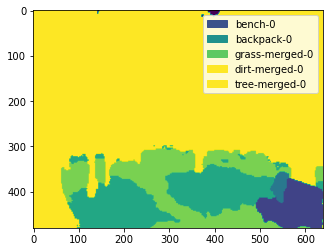

000000184978


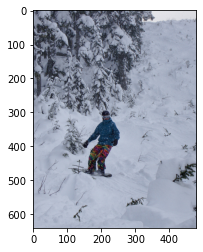

sam oneformer greedyiou_area_weighted: 0.08293919265270233
sam mask2former greedyiou_area_weighted: 0.08461035788059235
sam maskformer greedyiou_area_weighted: 0.08377926051616669
------------------------------ SAM ------------------------------


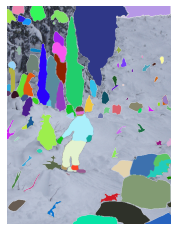

------------------------------ oneformer ------------------------------


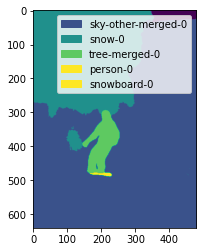

------------------------------ mask2former ------------------------------


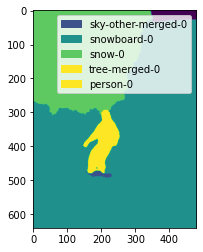

------------------------------ maskformer ------------------------------


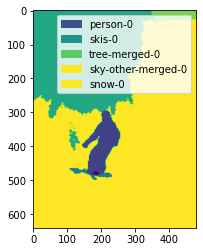

000000433980


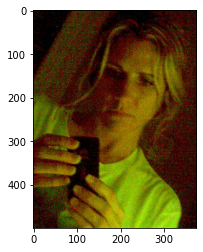

sam oneformer greedyiou_area_weighted: 0.08126489818096161
sam mask2former greedyiou_area_weighted: 0.08487466722726822
sam maskformer greedyiou_area_weighted: 0.05504075065255165
------------------------------ SAM ------------------------------


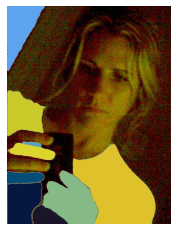

------------------------------ oneformer ------------------------------


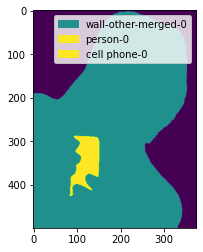

------------------------------ mask2former ------------------------------


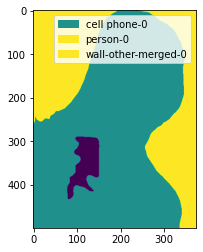

------------------------------ maskformer ------------------------------


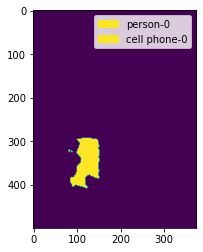

000000182441


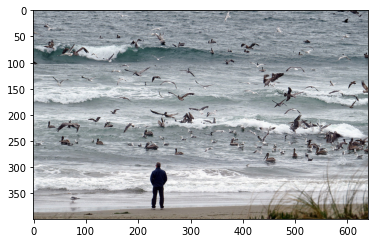

sam oneformer greedyiou_area_weighted: 0.08584549278020859
sam mask2former greedyiou_area_weighted: 0.07009440660476685
sam maskformer greedyiou_area_weighted: 0.04913958162069321
------------------------------ SAM ------------------------------


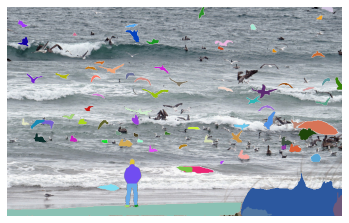

------------------------------ oneformer ------------------------------


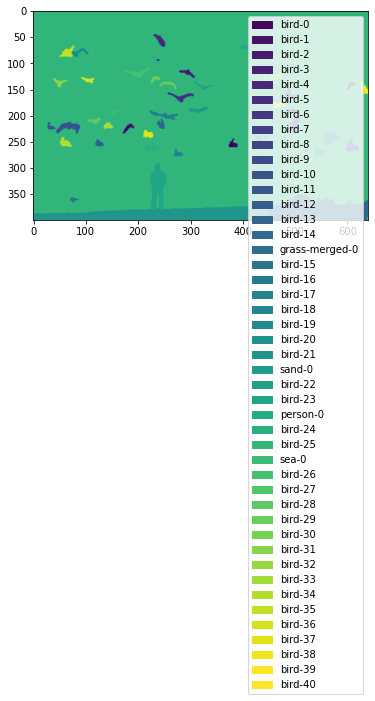

------------------------------ mask2former ------------------------------


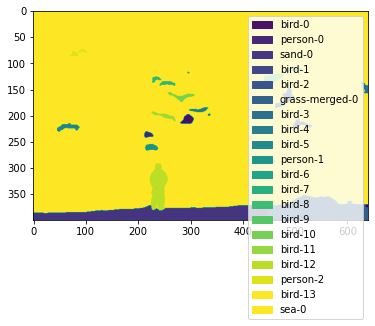

------------------------------ maskformer ------------------------------


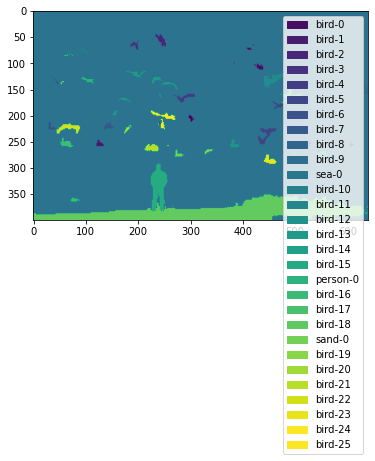

000000449406


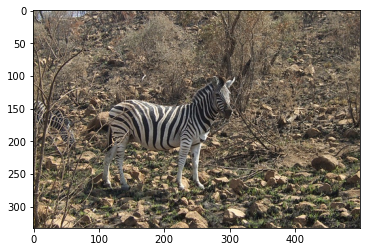

sam oneformer greedyiou_area_weighted: 0.08739285916090012
sam mask2former greedyiou_area_weighted: 0.07888942211866379
sam maskformer greedyiou_area_weighted: 0.08209369331598282
------------------------------ SAM ------------------------------


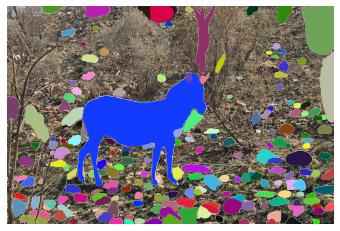

------------------------------ oneformer ------------------------------


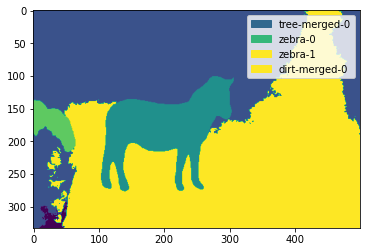

------------------------------ mask2former ------------------------------


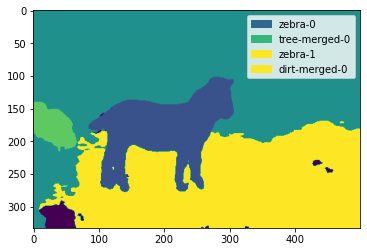

------------------------------ maskformer ------------------------------


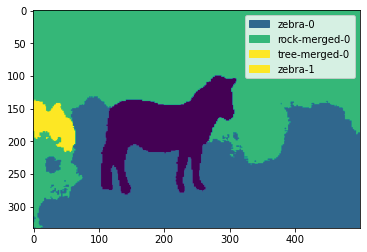

000000034205


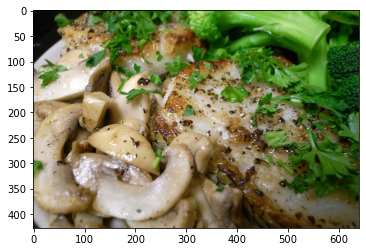

sam oneformer greedyiou_area_weighted: 0.09048066288232803
sam mask2former greedyiou_area_weighted: 0.08580980449914932
sam maskformer greedyiou_area_weighted: 0.06811109185218811
------------------------------ SAM ------------------------------


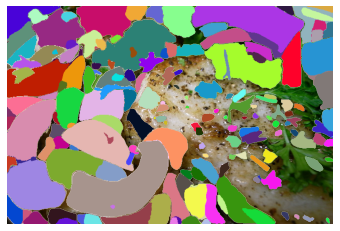

------------------------------ oneformer ------------------------------


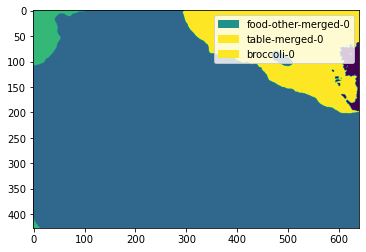

------------------------------ mask2former ------------------------------


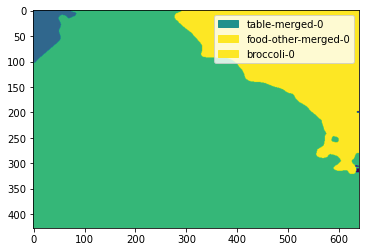

------------------------------ maskformer ------------------------------


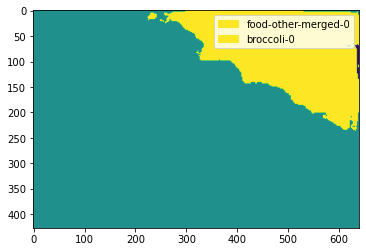

000000339870


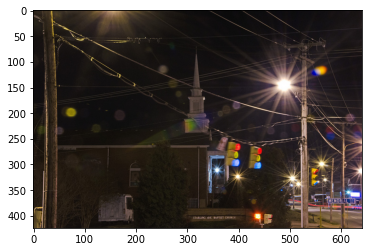

sam oneformer greedyiou_area_weighted: 0.09115643799304962
sam mask2former greedyiou_area_weighted: 0.04613471403717995
sam maskformer greedyiou_area_weighted: 0.09164988249540329
------------------------------ SAM ------------------------------


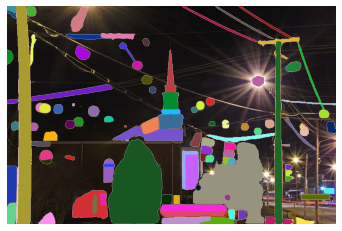

------------------------------ oneformer ------------------------------


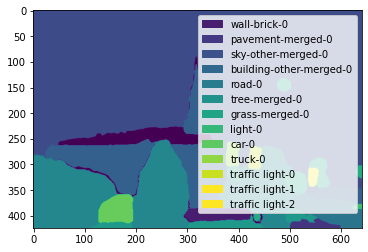

------------------------------ mask2former ------------------------------


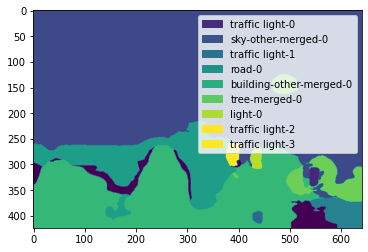

------------------------------ maskformer ------------------------------


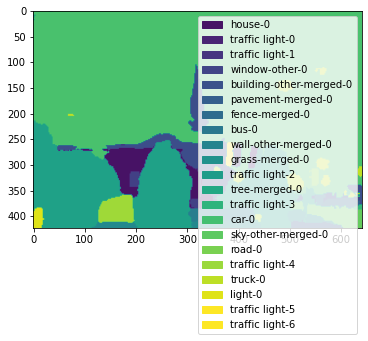

000000127476


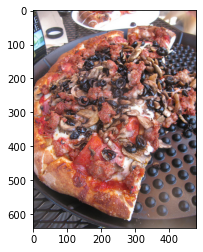

sam oneformer greedyiou_area_weighted: 0.0940374806523323
sam mask2former greedyiou_area_weighted: 0.056505389511585236
sam maskformer greedyiou_area_weighted: 0.05144064500927925
------------------------------ SAM ------------------------------


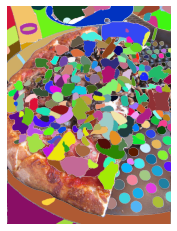

------------------------------ oneformer ------------------------------


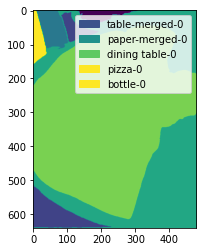

------------------------------ mask2former ------------------------------


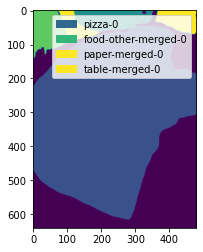

------------------------------ maskformer ------------------------------


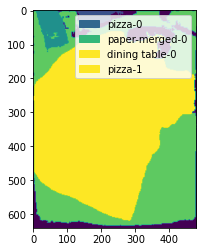

000000176847


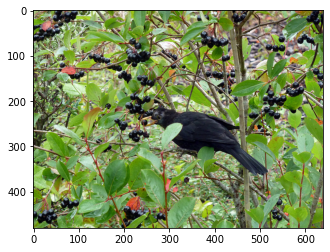

sam oneformer greedyiou_area_weighted: 0.10300420224666595
sam mask2former greedyiou_area_weighted: 0.10520489513874054
sam maskformer greedyiou_area_weighted: 0.10073776543140411
------------------------------ SAM ------------------------------


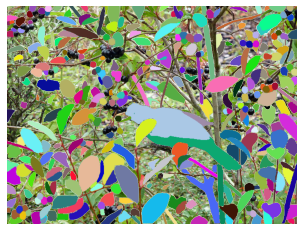

------------------------------ oneformer ------------------------------


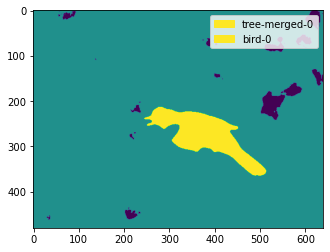

------------------------------ mask2former ------------------------------


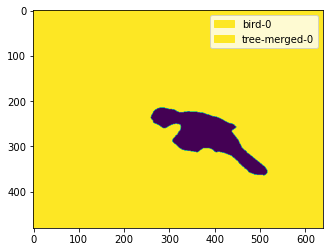

------------------------------ maskformer ------------------------------


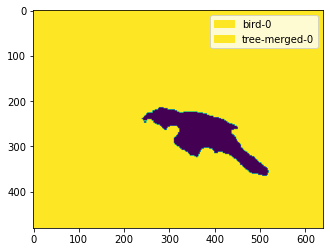

In [4]:
""" Find the images that sam predicts differently from the all top performers.
"""
saved_json_ls = sorted(glob.glob('/home/yjl/data/val2017_similarity/*'))
top_performers = ['oneformer', 'mask2former', 'maskformer']
combinations = [('sam', top_performer) for top_performer in top_performers]

# find max distance between sam and top performers for each image
max_distance_ls = []
for saved_json in saved_json_ls:
	with open(saved_json, 'r') as file:
		data = json.load(file)
	max_distance = 0
	for model1, model2 in combinations:
		max_distance = max(max_distance, data[model1+'_'+model2]['greedyiou_area_weighted'])
	max_distance_ls.append(max_distance)
max_distance_ls = np.array(max_distance_ls)

# find the minimum 5 value and their image name
idx_ls = max_distance_ls.argsort()[:20]
print(max_distance_ls[idx_ls])
print([os.path.basename(saved_json_ls[i]).split('.')[0] for i in idx_ls])

# show the images
for i in idx_ls:
	img_name = os.path.basename(saved_json_ls[i]).split('.')[0]
	img_path = f'/home/yjl/data/val2017/{img_name}.jpg'
	print(img_name)
	img = Image.open(img_path)
	plt.imshow(img)
	plt.show()
	# print ious of combinations
	with open(saved_json_ls[i], 'r') as file:
		data = json.load(file)
	for model1, model2 in combinations:
		print(model1, model2, "greedyiou_area_weighted:", data[model1+'_'+model2]['greedyiou_area_weighted'])
	# show segmentation results of top performers
	print('-'*30, 'SAM', '-'*30)
	sam_demo(img_path, mask_generator, transparency=0)
	for m in top_performers:
		print('-'*30, m, '-'*30)
		show_segmentation(img_name=img_name, model_name=m, id2label=id2label)